In [2]:
library(jsonlite)
library(ggmap)
library(dplyr)

setwd("/home/mapastec/Documents/studia/KoloNaukowe/dane/remastered/source/katowiceVisualisations")

Loading required package: ggplot2

Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [3]:
# Load data

df <- fromJSON('data/przystanki.json')
all <- read.csv("data/lokale_48.csv", sep = ",", header = TRUE, stringsAsFactors = FALSE)
markety <- read.csv("data/markety1.csv", sep = ",", header = TRUE)
medic <- read.csv("data/medic.csv", sep = ",", header = TRUE)
szkoly <-read.csv("data/szkolykur.csv", sep = ";", header = TRUE, stringsAsFactors = FALSE)

# prepare map

katowice_map_g_str <- get_map(location = "katowice", zoom = 12)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=katowice&zoom=12&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=katowice&sensor=false


In [4]:
# przystanki

przystanki <- df$elements
przystanki$names <- przystanki$tags$name
przystanki <- subset(przystanki, select = c(names,lat,lon))

str(przystanki)
head(przystanki)

'data.frame':	1669 obs. of  3 variables:
 $ names: chr  "Ochojec Wapienna" "Ochojec Sadowa" "Ochojec Ziołowa" "Piotrowice Skrzyżowanie" ...
 $ lat  : num  50.2 50.2 50.2 50.2 50.2 ...
 $ lon  : num  19 19 19 19 19 ...


names,lat,lon
Ochojec Wapienna,50.22103,18.98966
Ochojec Sadowa,50.21614,18.98993
Ochojec Ziołowa,50.21317,18.98871
Piotrowice Skrzyżowanie,50.20923,18.97410
Piotrowice Dworzec PKP,50.21587,18.97172
Giszowiec Karolinki,50.22678,19.05639


Using zoom = 12...
Map from URL : http://tile.stamen.com/toner-lite/12/2262/1383.png
Map from URL : http://tile.stamen.com/toner-lite/12/2263/1383.png
Map from URL : http://tile.stamen.com/toner-lite/12/2264/1383.png
Map from URL : http://tile.stamen.com/toner-lite/12/2265/1383.png
Map from URL : http://tile.stamen.com/toner-lite/12/2266/1383.png
Map from URL : http://tile.stamen.com/toner-lite/12/2262/1384.png
Map from URL : http://tile.stamen.com/toner-lite/12/2263/1384.png
Map from URL : http://tile.stamen.com/toner-lite/12/2264/1384.png
Map from URL : http://tile.stamen.com/toner-lite/12/2265/1384.png
Map from URL : http://tile.stamen.com/toner-lite/12/2266/1384.png
Map from URL : http://tile.stamen.com/toner-lite/12/2262/1385.png
Map from URL : http://tile.stamen.com/toner-lite/12/2263/1385.png
Map from URL : http://tile.stamen.com/toner-lite/12/2264/1385.png
Map from URL : http://tile.stamen.com/toner-lite/12/2265/1385.png
Map from URL : http://tile.stamen.com/toner-lite/12/2266/

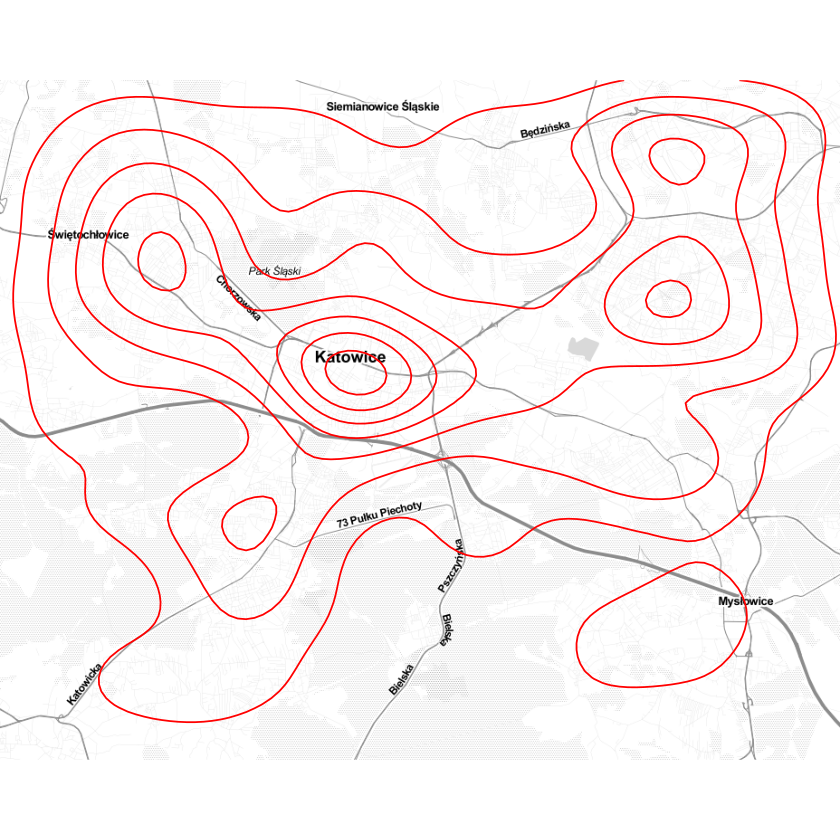

In [5]:
qmplot(lon, lat, data = przystanki, maptype = "toner-lite", geom = "density2d", color = I("red"))

Map from URL : http://tile.stamen.com/toner-background/12/2262/1383.png
Map from URL : http://tile.stamen.com/toner-background/12/2263/1383.png
Map from URL : http://tile.stamen.com/toner-background/12/2264/1383.png
Map from URL : http://tile.stamen.com/toner-background/12/2265/1383.png
Map from URL : http://tile.stamen.com/toner-background/12/2266/1383.png
Map from URL : http://tile.stamen.com/toner-background/12/2262/1384.png
Map from URL : http://tile.stamen.com/toner-background/12/2263/1384.png
Map from URL : http://tile.stamen.com/toner-background/12/2264/1384.png
Map from URL : http://tile.stamen.com/toner-background/12/2265/1384.png
Map from URL : http://tile.stamen.com/toner-background/12/2266/1384.png
Map from URL : http://tile.stamen.com/toner-background/12/2262/1385.png
Map from URL : http://tile.stamen.com/toner-background/12/2263/1385.png
Map from URL : http://tile.stamen.com/toner-background/12/2264/1385.png
Map from URL : http://tile.stamen.com/toner-background/12/2265/1

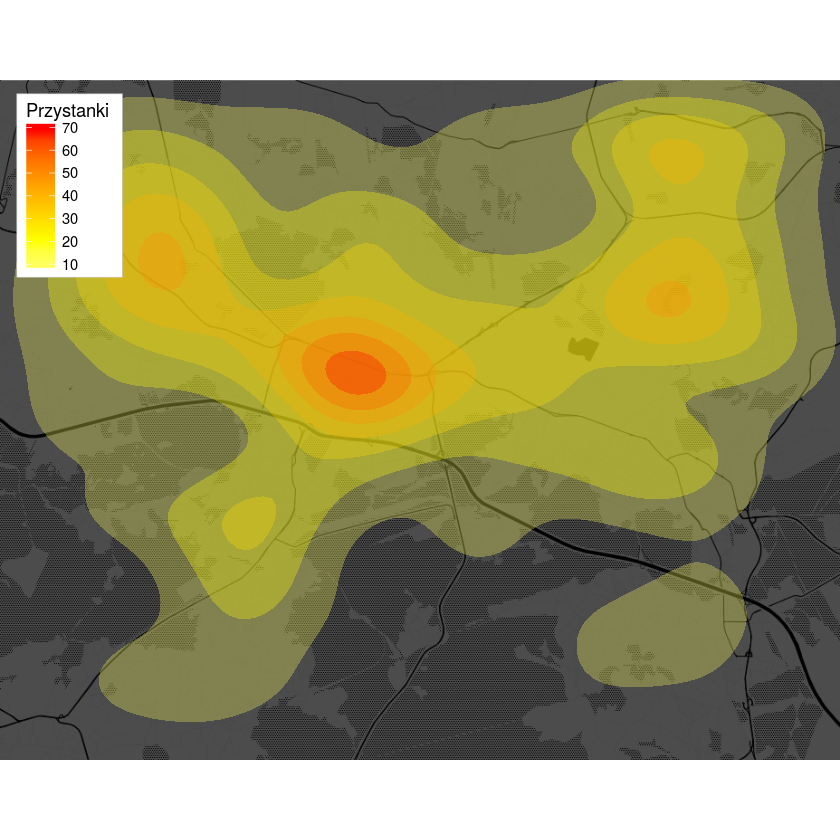

In [6]:
qmplot(lon, lat, data = przystanki, geom = "blank", zoom = 12, maptype = "toner-background", darken = .7, legend = "topleft") +
  stat_density_2d(aes(fill = ..level..), geom = "polygon", alpha = .3, color = NA) +
  scale_fill_gradient2("Przystanki", low = "white", mid = "yellow", high = "red", midpoint = 20)

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”Warning message:
“Removed 464 rows containing non-finite values (stat_density2d).”Warning message:
“Removed 464 rows containing non-finite values (stat_density2d).”

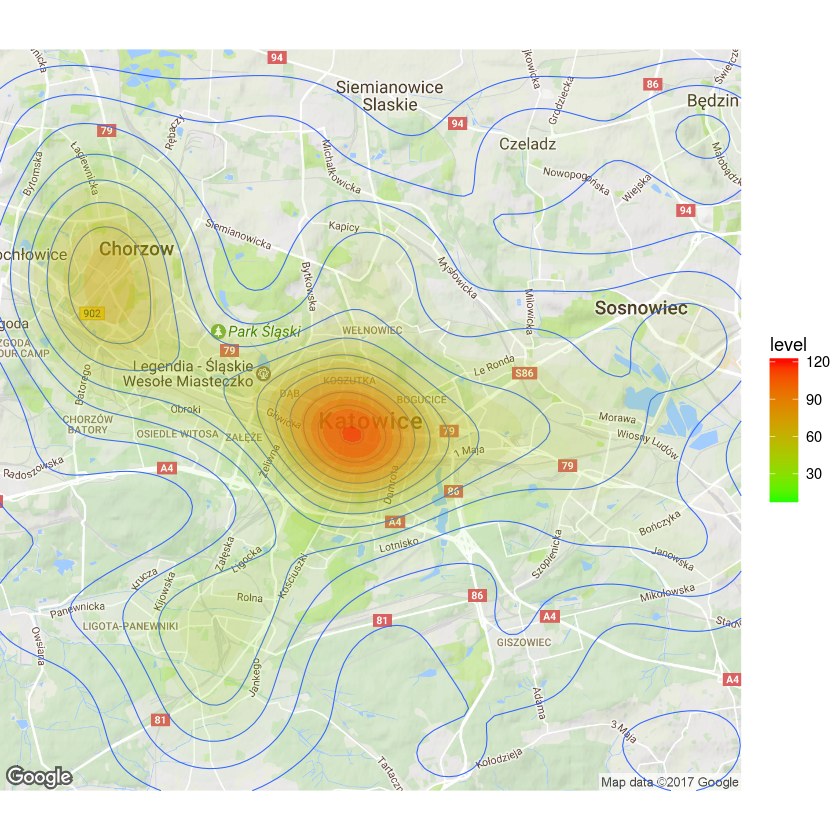

In [7]:
ggmap(katowice_map_g_str, extent = "device") + geom_density2d(data = przystanki, aes(x = lon, y = lat), size = 0.3) + 
  stat_density2d(data = przystanki, 
                 aes(x = lon, y = lat, fill = ..level.., alpha = ..level..), size = 0.01, 
                 bins = 16, geom = "polygon") + scale_fill_gradient(low = "green", high = "red") + 
  scale_alpha(range = c(0, 0.3), guide = FALSE)

'data.frame':	350 obs. of  16 variables:
 $ Nazwa      : chr  "Gimnazjum dla Dorosłych" "GINAZJUM NR 17 W ZESPOLE SZKÓŁ NR 2" "Gimnazjum nr 7" "Gimnazjum Nr 8 im. Królowej Jadwigi w Katowicach" ...
 $ Typ        : chr  "Gimnazjum" "Gimnazjum" "Gimnazjum" "Gimnazjum" ...
 $ Miejscowosc: chr  "Katowice" "Katowice" "Katowice" "Katowice" ...
 $ Gmina      : chr  "M. Katowice" "M. Katowice" "M. Katowice" "M. Katowice" ...
 $ Poczta     : chr  "Katowice" "Katowice" "Katowice" "Katowice" ...
 $ KodPoczt   : chr  "40-326" "40-749" "40-861" "40-881" ...
 $ Ulica      : chr  "Techników" "GOETLA" "Gliwicka" "B. Chrobrego" ...
 $ NrDomu     : chr  "11" "2" "228" "4" ...
 $ Telefon    : int  322566372 322550855 322540626 322546730 323088282 322045908 326084688 327819898 322549194 322549194 ...
 $ eMail      : chr  "kcez.sekretariat@dmail.com" "zsz2murcki@poczta.onet.pl" "sekretariat@zs7.katowice.pl" "sekretariat@zso3.katowice.pl" ...
 $ KategUcz   : chr  "Dorośli" "Dzieci lub młodzież" "Dzieci lub 

Using zoom = 12...
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

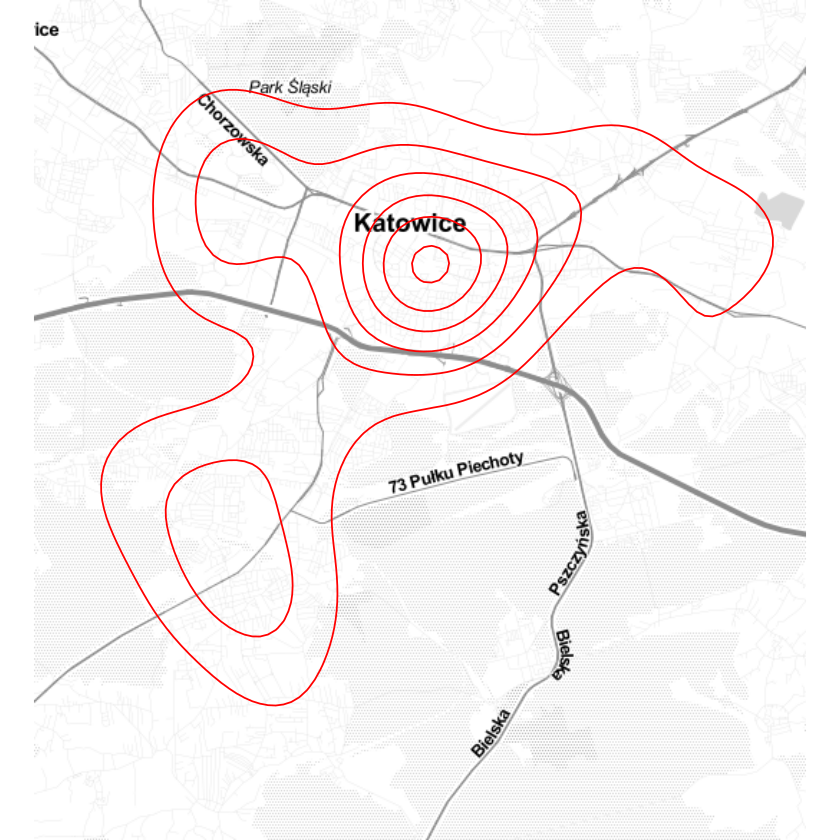

In [8]:
# szkoly
str(szkoly)

qmplot(lon, lat, data = szkoly, maptype = "toner-lite", geom = "density2d", color = I("red"))

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

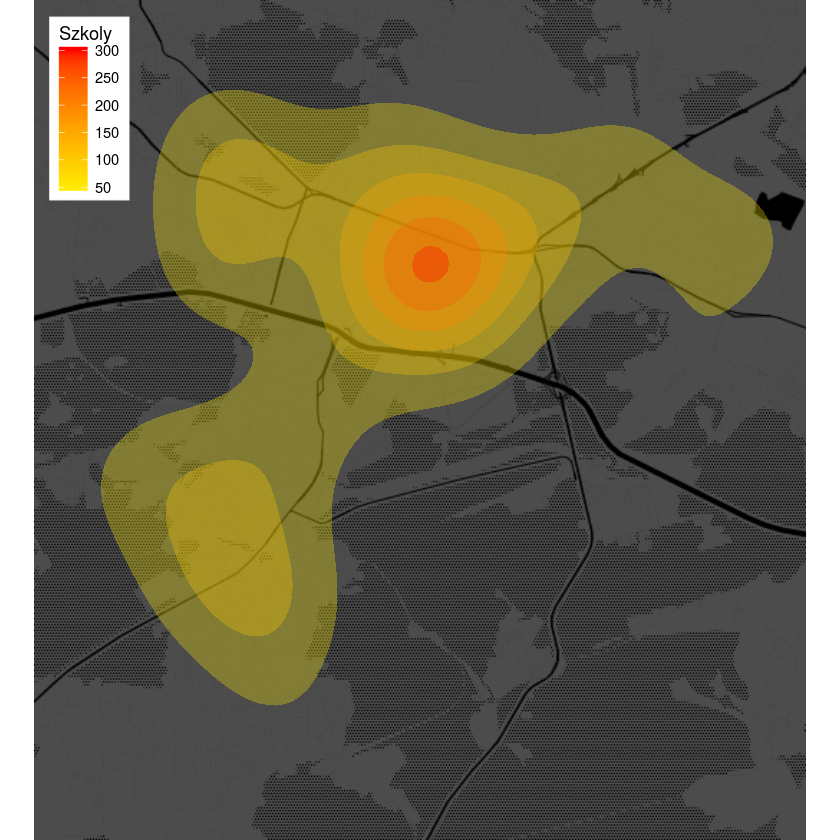

In [9]:
qmplot(lon, lat, data = szkoly, geom = "blank", zoom = 12, maptype = "toner-background", darken = .7, legend = "topleft") +
  stat_density_2d(aes(fill = ..level..), geom = "polygon", alpha = .3, color = NA) +
  scale_fill_gradient2("Szkoly", low = "white", mid = "yellow", high = "red", midpoint = 20)

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”Warning message:
“Removed 10 rows containing non-finite values (stat_density2d).”Warning message:
“Removed 10 rows containing non-finite values (stat_density2d).”

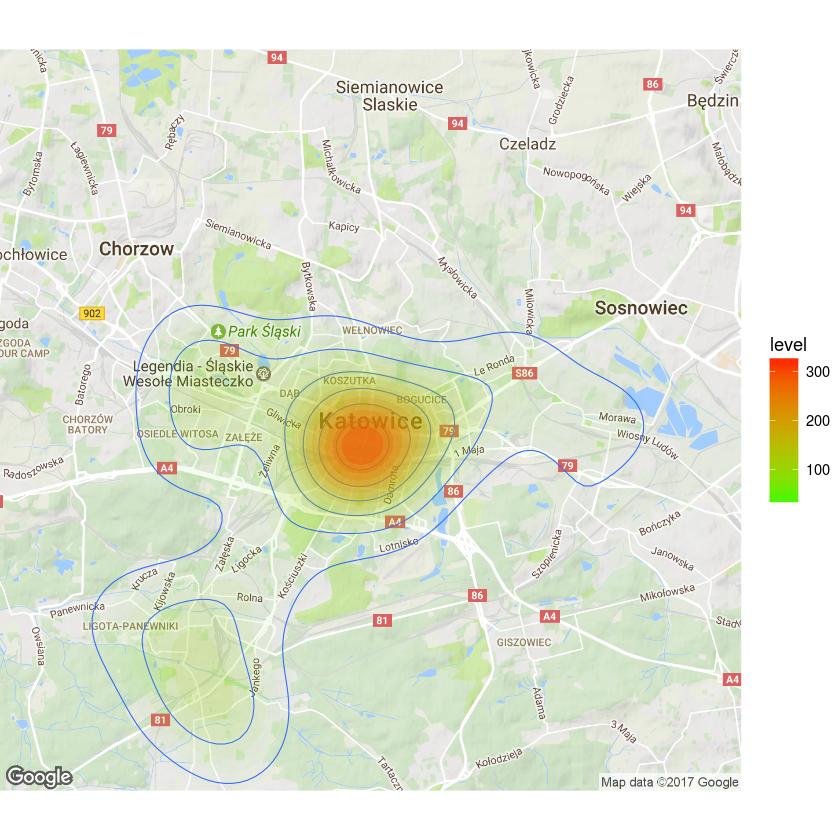

In [10]:
ggmap(katowice_map_g_str, extent = "device") + geom_density2d(data = szkoly, aes(x = lon, y = lat), size = 0.3) + 
  stat_density2d(data = szkoly, 
                 aes(x = lon, y = lat, fill = ..level.., alpha = ..level..), size = 0.01, 
                 bins = 16, geom = "polygon") + scale_fill_gradient(low = "green", high = "red") + 
  scale_alpha(range = c(0, 0.3), guide = FALSE)

'data.frame':	2061 obs. of  3 variables:
 $ name: Factor w/ 223 levels "4 pory roku",..: 84 67 167 14 39 83 199 95 22 30 ...
 $ lat : num  50.2 50.2 50.2 50.2 50.2 ...
 $ lon : num  19.1 19 19.1 19.1 19.1 ...


Using zoom = 12...
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

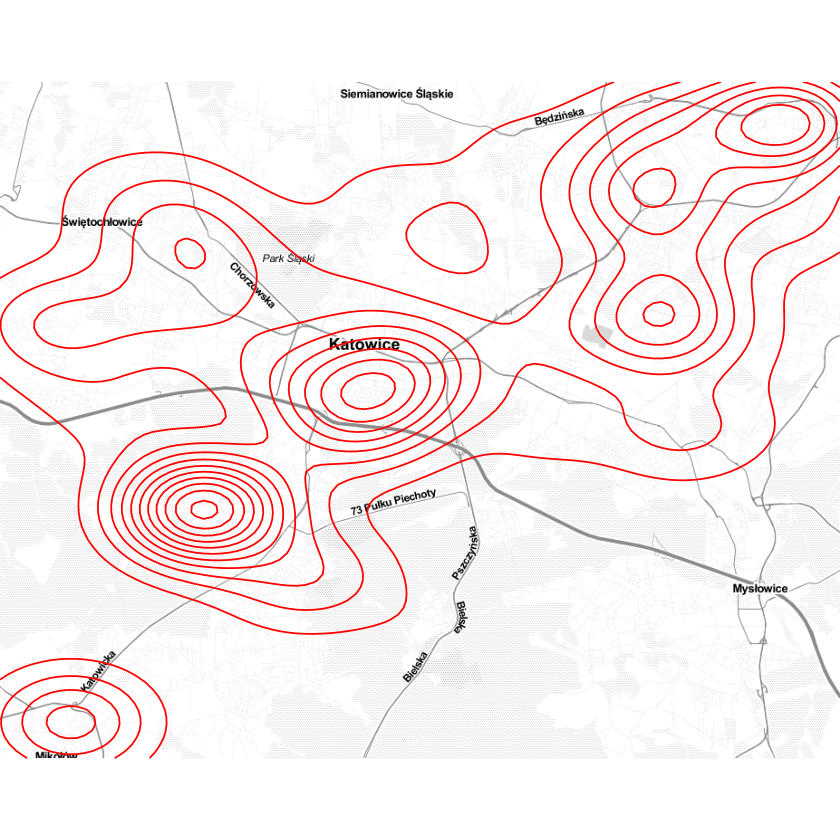

In [11]:
# przychodnie

str(medic)

qmplot(lon, lat, data = medic, maptype = "toner-lite", geom = "density2d", color = I("red"))

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

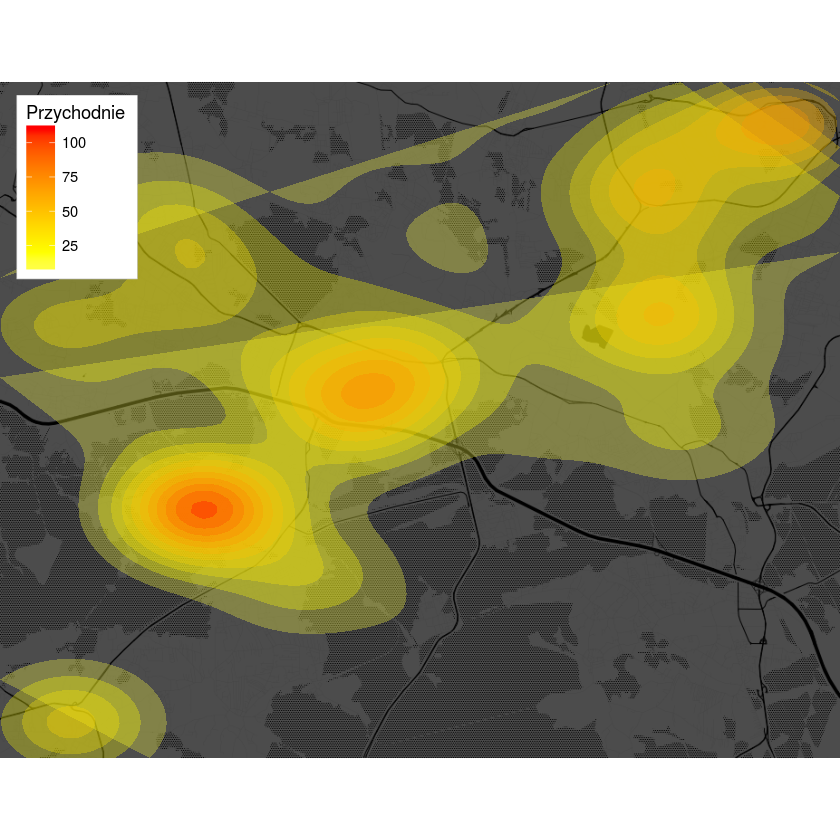

In [12]:
qmplot(lon, lat, data = medic, geom = "blank", zoom = 12, maptype = "toner-background", darken = .7, legend = "topleft") +
  stat_density_2d(aes(fill = ..level..), geom = "polygon", alpha = .3, color = NA) +
  scale_fill_gradient2("Przychodnie", low = "white", mid = "yellow", high = "red", midpoint = 20)

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”Warning message:
“Removed 562 rows containing non-finite values (stat_density2d).”Warning message:
“Removed 562 rows containing non-finite values (stat_density2d).”

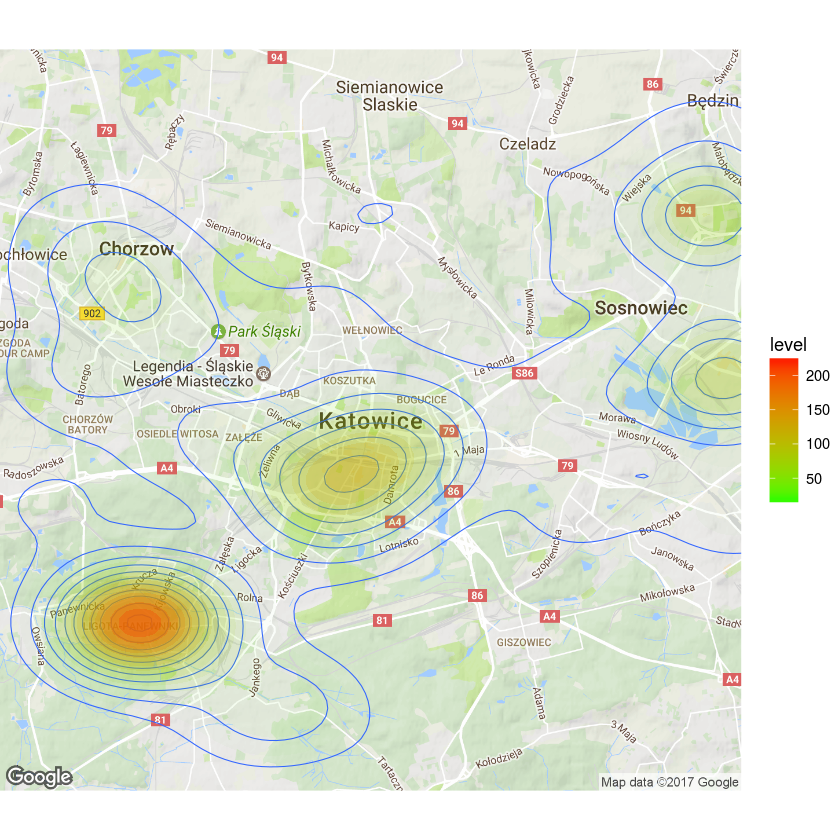

In [13]:
ggmap(katowice_map_g_str, extent = "device") + geom_density2d(data = medic, aes(x = lon, y = lat), size = 0.3) + 
  stat_density2d(data = medic, 
                 aes(x = lon, y = lat, fill = ..level.., alpha = ..level..), size = 0.01, 
                 bins = 16, geom = "polygon") + scale_fill_gradient(low = "green", high = "red") + 
  scale_alpha(range = c(0, 0.3), guide = FALSE)

'data.frame':	324 obs. of  4 variables:
 $ name: Factor w/ 25 levels "Aldi","ALDI",..: 25 22 15 1 9 20 13 23 4 19 ...
 $ type: Factor w/ 1 level "supermarket": 1 1 1 1 1 1 1 1 1 1 ...
 $ lat : num  50.3 50.3 50.2 50.3 50.3 ...
 $ lon : num  19 19 19 19 19 ...


Using zoom = 13...
Map from URL : http://tile.stamen.com/toner-lite/13/4527/2767.png
Map from URL : http://tile.stamen.com/toner-lite/13/4528/2767.png
Map from URL : http://tile.stamen.com/toner-lite/13/4529/2767.png
Map from URL : http://tile.stamen.com/toner-lite/13/4530/2767.png
Map from URL : http://tile.stamen.com/toner-lite/13/4527/2768.png
Map from URL : http://tile.stamen.com/toner-lite/13/4528/2768.png
Map from URL : http://tile.stamen.com/toner-lite/13/4529/2768.png
Map from URL : http://tile.stamen.com/toner-lite/13/4530/2768.png
Map from URL : http://tile.stamen.com/toner-lite/13/4527/2769.png
Map from URL : http://tile.stamen.com/toner-lite/13/4528/2769.png
Map from URL : http://tile.stamen.com/toner-lite/13/4529/2769.png
Map from URL : http://tile.stamen.com/toner-lite/13/4530/2769.png
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

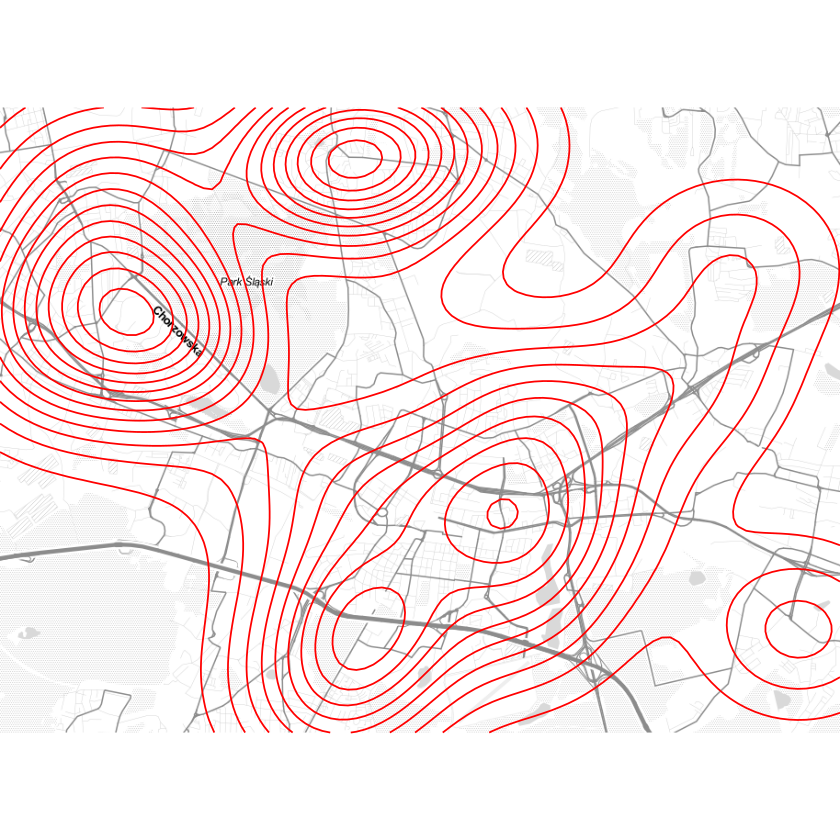

In [14]:
# markety

str(markety)

qmplot(lon, lat, data = markety, maptype = "toner-lite", geom = "density2d", color = I("red"))

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

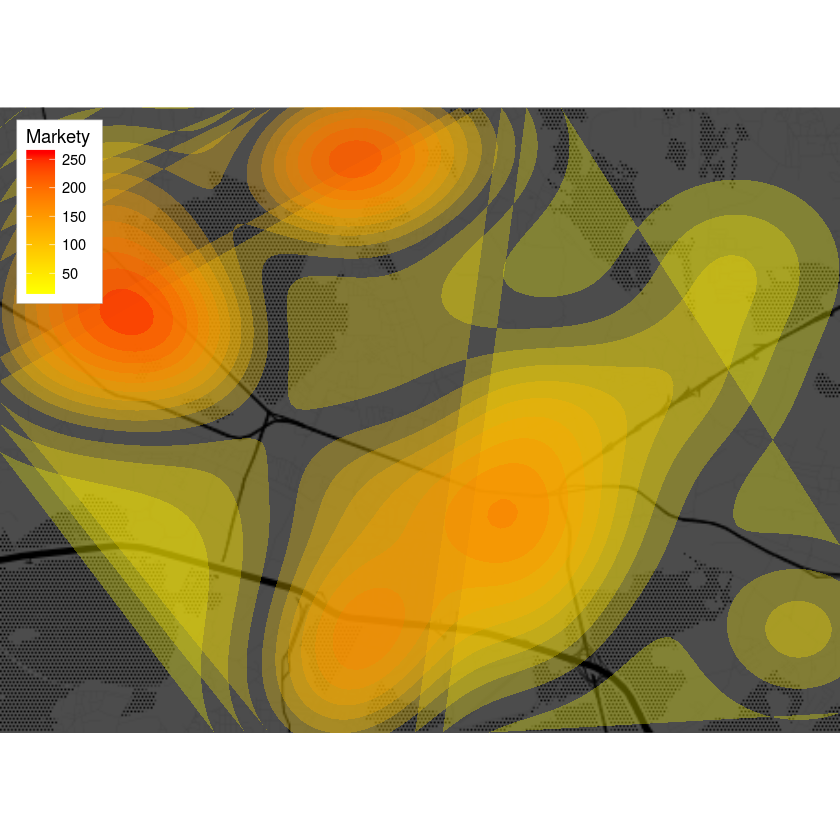

In [15]:
qmplot(lon, lat, data = markety, geom = "blank", zoom = 12, maptype = "toner-background", darken = .7, legend = "topleft") +
  stat_density_2d(aes(fill = ..level..), geom = "polygon", alpha = .3, color = NA) +
  scale_fill_gradient2("Markety", low = "white", mid = "yellow", high = "red", midpoint = 20)

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

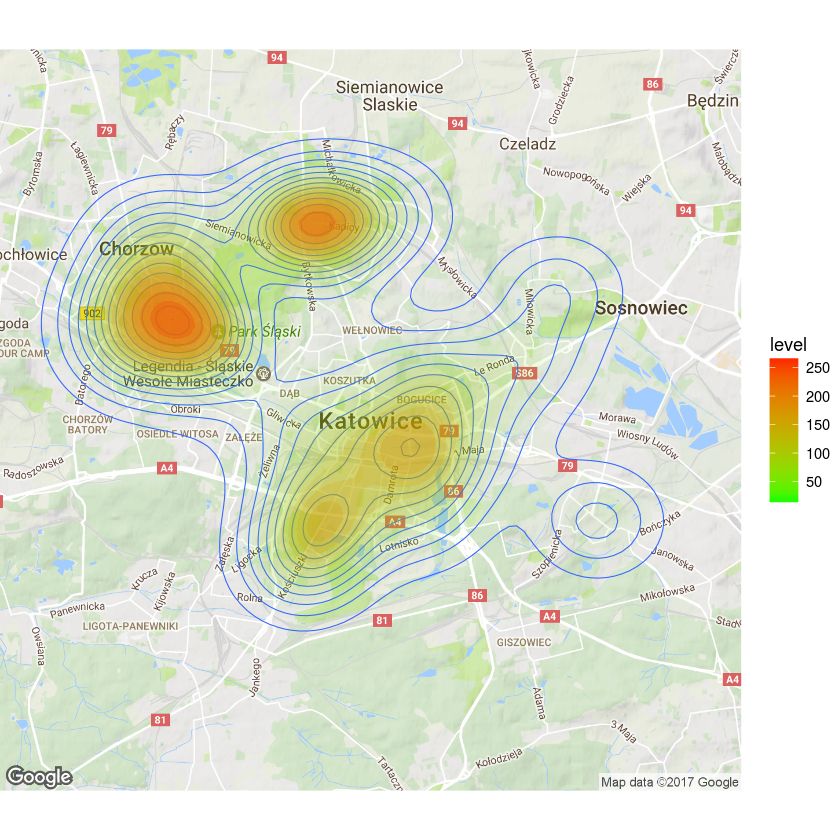

In [16]:
ggmap(katowice_map_g_str, extent = "device") + geom_density2d(data = markety, aes(x = lon, y = lat), size = 0.3) + 
  stat_density2d(data = markety, 
                 aes(x = lon, y = lat, fill = ..level.., alpha = ..level..), size = 0.01, 
                 bins = 16, geom = "polygon") + scale_fill_gradient(low = "green", high = "red") + 
  scale_alpha(range = c(0, 0.3), guide = FALSE)

In [18]:
# Apartments price and scale. New dataframe will be created with important data only.

str(all)

apartments <- subset(all, select = c(Cena.jednostkowa.netto, Rodzaj.transakcji, 
                                     Kupujacy, Pow..lokalu.obliczeniowa, lat, lon))

'data.frame':	3516 obs. of  34 variables:
 $ lp.                                      : int  1 2 3 4 5 6 7 9 12 13 ...
 $ Cena.jednostkowa.netto                   : num  2294 3083 1794 2401 2401 ...
 $ Z.powierzchnia.przynalezna               : chr  "Tak" "Nie" "Nie" "Tak" ...
 $ Data.transakcji                          : int  42671 42227 42214 42153 42153 42153 42797 42419 42396 42396 ...
 $ Rodzaj.transakcji                        : chr  "umowa sprzedazy - rynek wtorny" "umowa sprzedazy - rynek wtorny" "umowa sprzedazy - rynek wtorny" "umowa sprzedazy - rynek wtorny" ...
 $ Sprzedajacy                              : chr  "spolka" "osoba fizyczna" "osoba fizyczna" "osoba fizyczna" ...
 $ Kupujacy                                 : chr  "osoba fizyczna" "osoba fizyczna" "osoba fizyczna" "osoba fizyczna" ...
 $ Wojewodztwo                              : chr  "Slaskie" "Slaskie" "Slaskie" "Slaskie" ...
 $ Powiat                                   : chr  "Katowice" "Katowice" "Katowice" "Ka

In [19]:
str(apartments)

'data.frame':	3516 obs. of  6 variables:
 $ Cena.jednostkowa.netto  : num  2294 3083 1794 2401 2401 ...
 $ Rodzaj.transakcji       : chr  "umowa sprzedazy - rynek wtorny" "umowa sprzedazy - rynek wtorny" "umowa sprzedazy - rynek wtorny" "umowa sprzedazy - rynek wtorny" ...
 $ Kupujacy                : chr  "osoba fizyczna" "osoba fizyczna" "osoba fizyczna" "osoba fizyczna" ...
 $ Pow..lokalu.obliczeniowa: num  58.9 48.6 37.9 62.5 62.5 ...
 $ lat                     : num  50.3 50.3 50.3 50.3 50.3 ...
 $ lon                     : num  19.1 19.1 19.1 19.1 19.1 ...


Warning message:
“Removed 101 rows containing missing values (geom_point).”

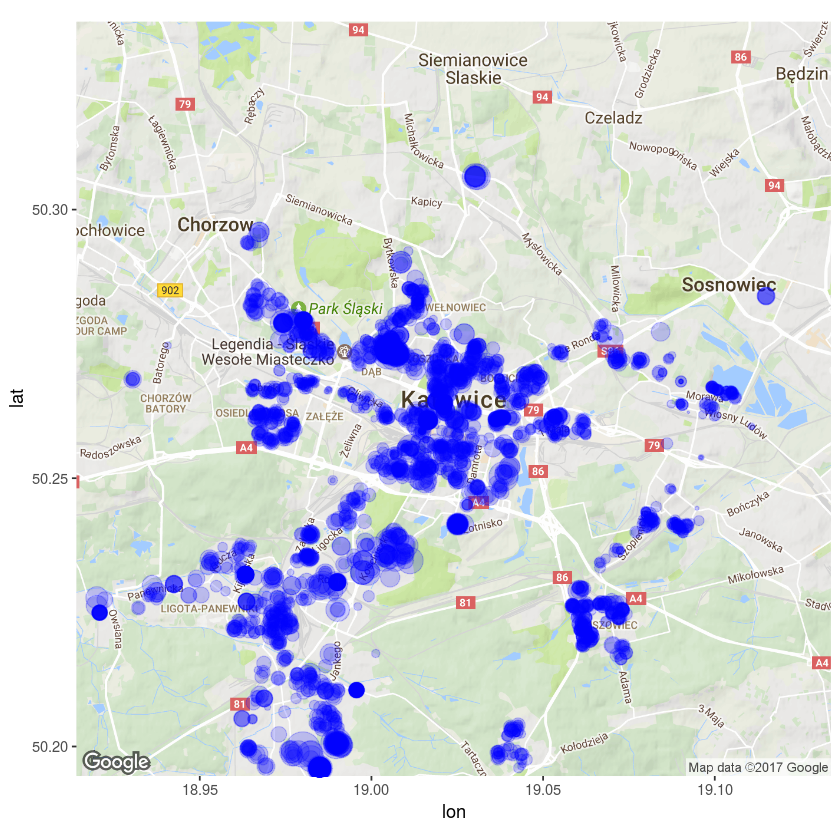

In [20]:
circle_scale_amt = 0.001 # make the circles 1% of the price.

KatowiceMAP = ggmap(katowice_map_g_str)

KatowiceMAP +
  geom_point(aes(x=lon, y=lat), data=apartments, col="Blue", alpha=0.2, 
             size=apartments$Cena.jednostkowa.netto*circle_scale_amt) + 
  scale_size_continuous(range=range(apartments$Cena.jednostkowa.netto))

Warning message:
“Removed 101 rows containing missing values (geom_point).”

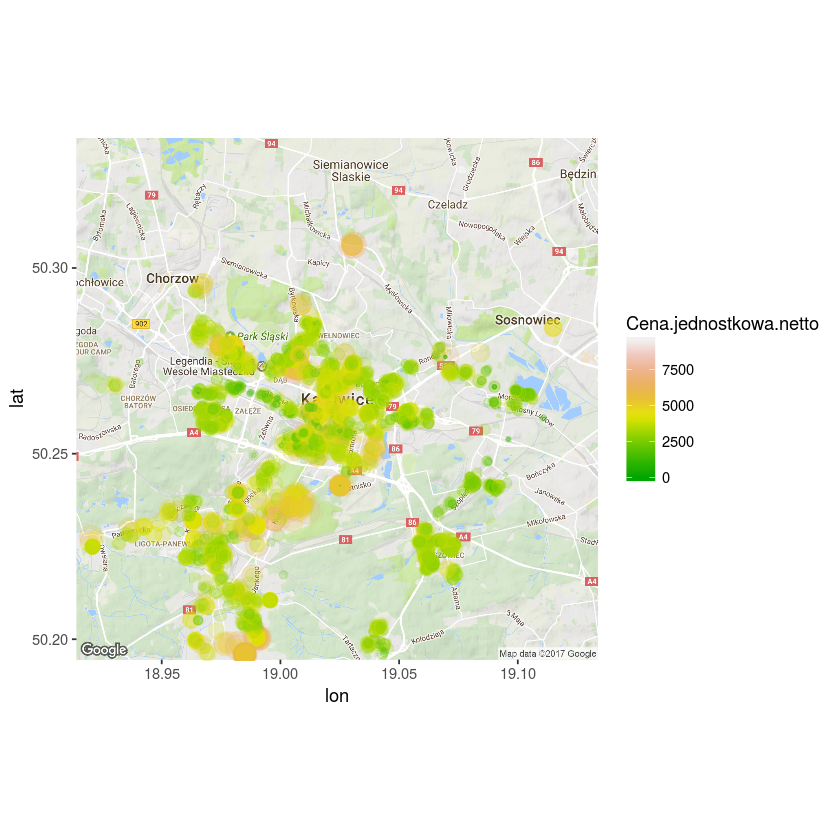

In [21]:
KatowiceMAP +
  geom_point(aes(x=lon, y=lat, color=Cena.jednostkowa.netto), data=apartments, alpha=0.2,
             size=apartments$Cena.jednostkowa.netto*circle_scale_amt) +
             scale_size_continuous(range=range(apartments$Cena.jednostkowa.netto)) +
             scale_colour_gradientn(colours = terrain.colors(10))

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”Warning message:
“Removed 101 rows containing non-finite values (stat_density2d).”Warning message:
“Removed 101 rows containing non-finite values (stat_density2d).”

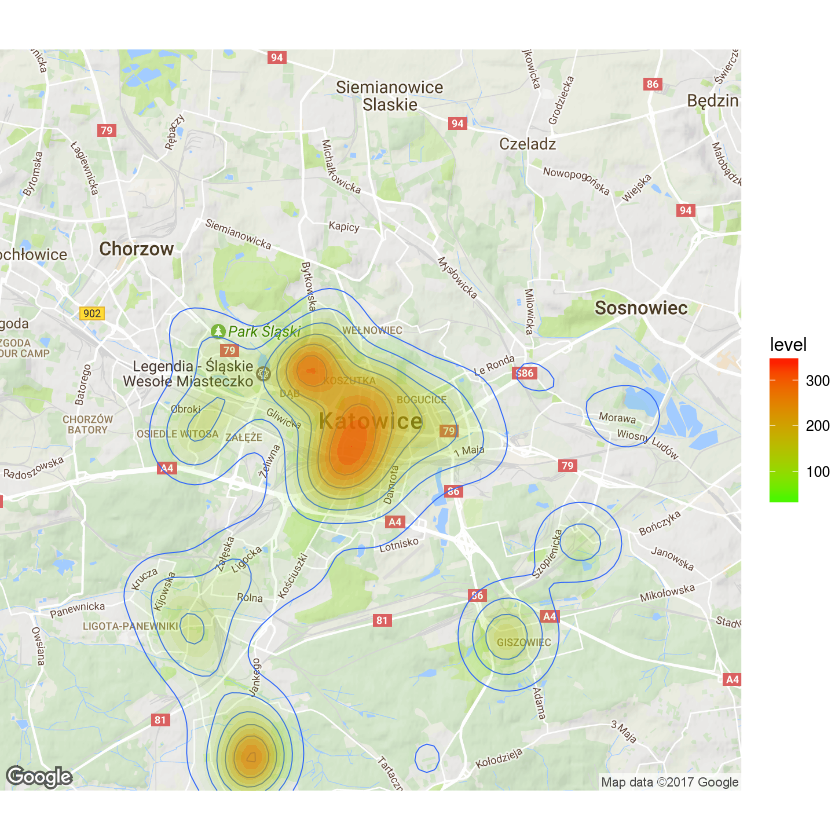

In [22]:
ggmap(katowice_map_g_str, extent = "device") + geom_density2d(data = apartments, aes(x = lon, y = lat), size = 0.3) + 
  stat_density2d(data = apartments, 
                 aes(x = lon, y = lat, fill = ..level.., alpha = ..level..), size = 0.01, 
                 bins = 16, geom = "polygon") + scale_fill_gradient(low = "green", high = "red") + 
  scale_alpha(range = c(0, 0.3), guide = FALSE)